# Imports

In [1]:
import sys, os
from pathlib import Path

# Notebook lives in Experimentation/, so add the repo root to sys.path
ROOT = Path.cwd().parent if Path.cwd().name == "Experimentation" else Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

import numpy as np
import pandas as pd
from Utils import LoadLorenzData
from Utils.Plotting import PlotNFeatSeries as PlotNFeatSeries
import matplotlib.pyplot as plt
# import torch


# VARS

In [2]:
DATAPATH = r"../Data/LorenzLift.npz"

# Data Exp

In [3]:
train, val, test, clean, states = LoadLorenzData(DATAPATH)

In [4]:
print(train.shape)

(14000, 30)


C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\2053595056.py:3: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


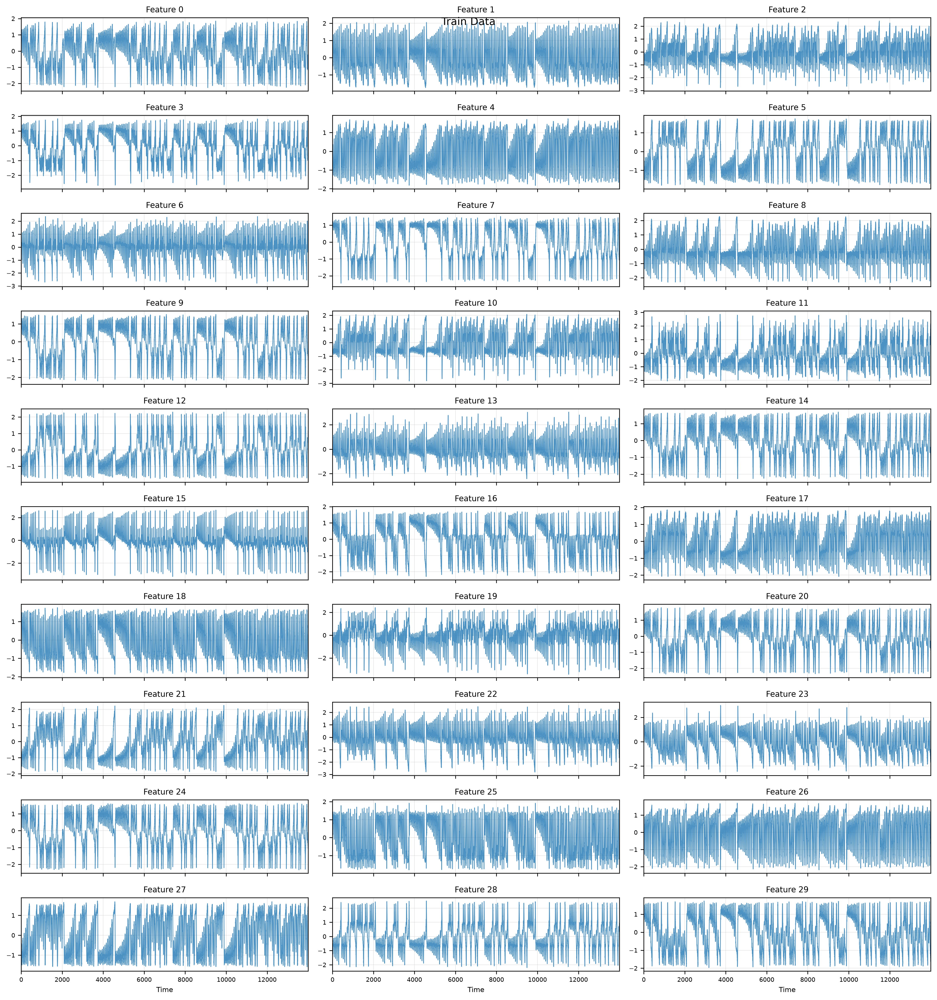

In [5]:
fig, axz = PlotNFeatSeries(train)
fig.suptitle("Train Data")
fig.show()


C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\205119057.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig1.show()


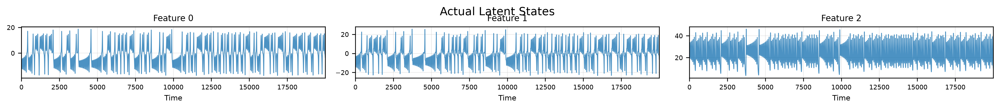

In [6]:
fig1, axz1 = PlotNFeatSeries(states)

fig1.suptitle("Actual Latent States")

fig1.show()

In [7]:
AnalysisObj = states

for i in range(AnalysisObj.shape[-1]):
    print(f"Max for feature{i} = {max(AnalysisObj[:,i])}")
    print(f"Min for feature{i} = {min(AnalysisObj[:,i])}")

    print("\n")


Max for feature0 = 18.73785698404295
Min for feature0 = -17.514873949685466


Max for feature1 = 25.572980264168116
Min for feature1 = -23.273600603398847


Max for feature2 = 46.11431083184803
Min for feature2 = 3.5845473364951435




# Autoencoder Training (no forecasting)

We only test whether `x_t -> h_t -> C_t -> x_hat_t` reconstructs, and whether `b_t = f(h_t)` carries the true Lorenz state.

In [8]:
import itertools

import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from tqdm.auto import tqdm
from IPython.display import clear_output

from Src import Encoder, LatentMapping, LatentRecon, LatentBounded, Decoder
from Utils.Plotting import PlotLossCurves

## Config

In [9]:
N = train.shape[-1]      # observation dim (30)
K = 3                    # unbounded forecast latent, = known intrinsic dim of Lorenz-63
A, B = 8, 8              # bounded latent C_t is A x B in [0, 1]

EPOCHS = 100
BATCH = 256
LR = 1e-3

W_CYCLE = 1.0            # || f^-1(f(h)) - h ||
W_CONSIST = 1.0          # || r(f^-1(b_t)) - C_t ||

PLOT_EVERY = 10
NOISE_FLOOR = 0.05 ** 2  # reconstruction MSE cannot meaningfully beat this

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
torch.manual_seed(0)
print(DEVICE, "| N =", N, "| K =", K, "| C =", (A, B))

cpu | N = 30 | K = 3 | C = (8, 8)


## Data

One sample = one 30-d observation. No windowing, no `t+1` targets.

In [10]:
XTrain = torch.tensor(train, dtype=torch.float32)
XVal = torch.tensor(val, dtype=torch.float32)
XTest = torch.tensor(test, dtype=torch.float32)

# Chronological split, so the true states line up index-for-index.
StatesTrain = states[:len(train)]
StatesVal = states[len(train):len(train) + len(val)]
StatesTest = states[len(train) + len(val):]

Loader = DataLoader(TensorDataset(XTrain), batch_size=BATCH, shuffle=True, drop_last=True)

XValDev = XVal.to(DEVICE)
XTestDev = XTest.to(DEVICE)
XTrainDev = XTrain.to(DEVICE)

print(XTrain.shape, XVal.shape, XTest.shape, StatesVal.shape)

torch.Size([14000, 30]) torch.Size([3000, 30]) torch.Size([3000, 30]) (3000, 3)


## Models

In [11]:
E = Encoder(N).to(DEVICE)
F = LatentMapping(N, K).to(DEVICE)
FInv = LatentRecon(K, N).to(DEVICE)
R = LatentBounded(N, A, B).to(DEVICE)
D = Decoder(A, B, N).to(DEVICE)

Models = [E, F, FInv, R, D]
Params = itertools.chain(*[m.parameters() for m in Models])
Opt = torch.optim.Adam(Params, lr=LR)
Mse = nn.MSELoss()

print(sum(p.numel() for m in Models for p in m.parameters()), "parameters")

106653 parameters


## Loss

In [12]:
def Forward(x):
    """Full pass. Returns the losses and the intermediates for plotting."""
    h = E(x)
    C = R(h)
    xhat = D(C)

    b = F(h)
    hh = FInv(b)

    Recon = Mse(xhat, x)
    Cycle = Mse(hh, h)
    Consist = Mse(R(hh), C)
    Total = Recon + W_CYCLE * Cycle + W_CONSIST * Consist

    return Total, Recon, Cycle, Consist, (h, b, C, xhat)


@torch.no_grad()
def Evaluate(x):
    for m in Models:
        m.eval()
    Out = Forward(x)
    for m in Models:
        m.train()
    return Out

## Training

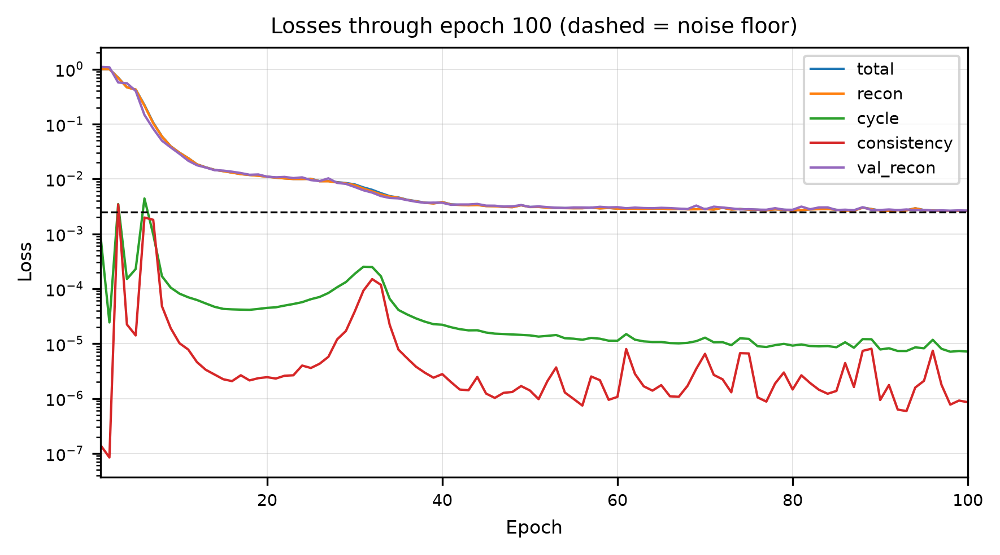

epoch 100/100 | total 2.620e-03 | recon 2.612e-03 | cycle 7.154e-06 | consist 8.556e-07 | val_recon 2.643e-03


In [13]:
History = {"total": [], "recon": [], "cycle": [], "consistency": [], "val_recon": []}

Epochs = tqdm(range(1, EPOCHS + 1), desc="epochs")
for Epoch in Epochs:
    Sums = [0.0, 0.0, 0.0, 0.0]
    Batches = tqdm(Loader, desc=f"epoch {Epoch}", leave=False)

    for (x,) in Batches:
        x = x.to(DEVICE)
        Total, Recon, Cycle, Consist, _ = Forward(x)

        Opt.zero_grad()
        Total.backward()
        Opt.step()

        Vals = [Total.item(), Recon.item(), Cycle.item(), Consist.item()]
        Sums = [s + v for s, v in zip(Sums, Vals)]
        Batches.set_postfix(recon=f"{Vals[1]:.2e}", cycle=f"{Vals[2]:.2e}", consist=f"{Vals[3]:.2e}")

    Means = [s / len(Loader) for s in Sums]
    ValRecon = Evaluate(XValDev)[1].item()

    for Key, Value in zip(["total", "recon", "cycle", "consistency"], Means):
        History[Key].append(Value)
    History["val_recon"].append(ValRecon)

    if Epoch % PLOT_EVERY == 0 or Epoch == EPOCHS:
        clear_output(wait=True)
        Fig, Ax = PlotLossCurves(History)
        Ax.axhline(NOISE_FLOOR, color="k", linestyle="--", linewidth=0.8)
        Ax.set_title(f"Losses through epoch {Epoch} (dashed = noise floor)", fontsize=9)
        plt.show()

    Epochs.write(
        f"epoch {Epoch:03d}/{EPOCHS} | total {Means[0]:.3e} | recon {Means[1]:.3e} | "
        f"cycle {Means[2]:.3e} | consist {Means[3]:.3e} | val_recon {ValRecon:.3e}"
    )

## Final losses

       total: 0.00262
       recon: 0.00261
       cycle: 0.00001
 consistency: 0.00000
   val_recon: 0.00264
 noise floor: 0.00250
  test recon: 0.00262


C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\2170398016.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  Fig.show()


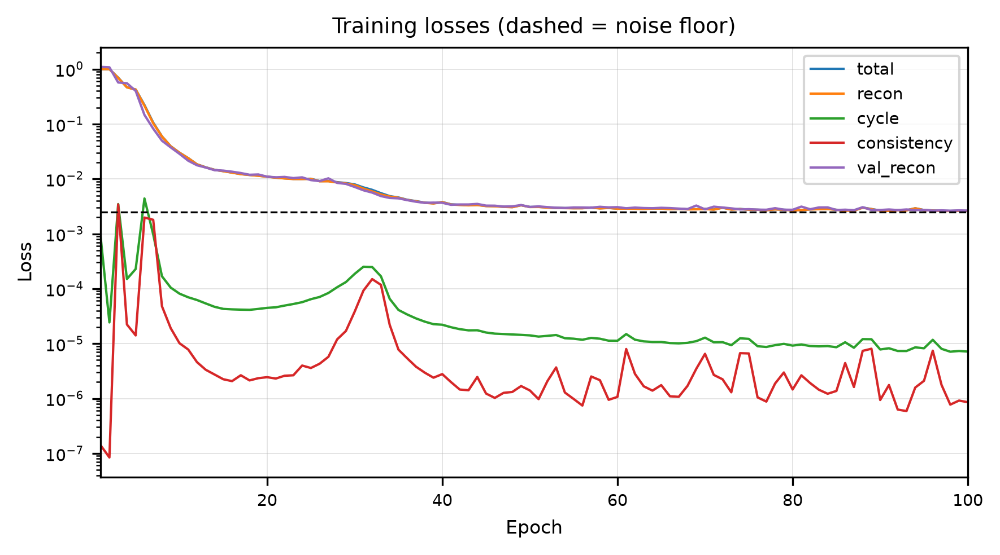

In [14]:
Fig, Ax = PlotLossCurves(History)
Ax.axhline(NOISE_FLOOR, color="k", linestyle="--", linewidth=0.8)
Ax.set_title("Training losses (dashed = noise floor)", fontsize=9)
Fig.show()

for Name, Values in History.items():
    print(f"{Name:>12}: {Values[-1]:.5f}")
print(f"{'noise floor':>12}: {NOISE_FLOOR:.5f}")
print(f"{'test recon':>12}: {Evaluate(XTestDev)[1].item():.5f}")

## True vs predicted observations

C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\2124065333.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


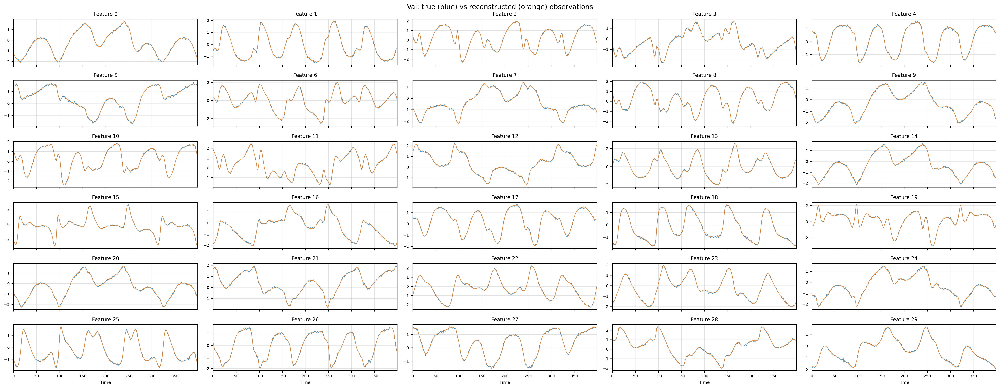

In [15]:
@torch.no_grad()
def Encode(x):
    """x (T, n) tensor on device -> (xhat, h, b, C) as numpy."""
    _, _, _, _, (h, b, C, xhat) = Evaluate(x)
    return xhat.cpu().numpy(), h.cpu().numpy(), b.cpu().numpy(), C.cpu().numpy()


XValHat, HVal, BVal, CVal = Encode(XValDev)
XTestHat, HTest, BTest, CTest = Encode(XTestDev)
_, HTrain, BTrain, CTrain = Encode(XTrainDev)

Slice = slice(0, 400)
Pair = np.stack([val[Slice], XValHat[Slice]])          # (2, ts, n) -> overlaid per feature
fig, axz = PlotNFeatSeries(Pair, Cols=5)
fig.suptitle("Val: true (blue) vs reconstructed (orange) observations", y=1.005)
fig.show()

C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\3438724008.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


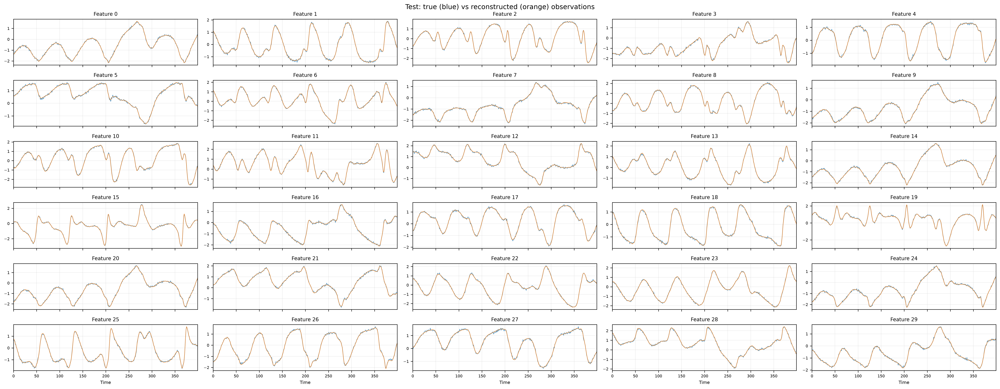

In [16]:
Pair = np.stack([test[Slice], XTestHat[Slice]])
fig, axz = PlotNFeatSeries(Pair, Cols=5)
fig.suptitle("Test: true (blue) vs reconstructed (orange) observations", y=1.005)
fig.show()

### Parity

C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\289091655.py:17: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


overall val R2:  0.9974
overall test R2: 0.9973


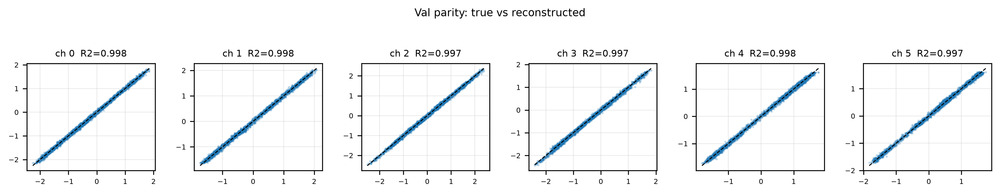

In [17]:
def R2(Y, YHat):
    Y, YHat = np.asarray(Y), np.asarray(YHat)
    return 1 - ((Y - YHat) ** 2).sum() / ((Y - Y.mean(0)) ** 2).sum()


Channels = [0, 1, 2, 3, 4, 5]
fig, axz = plt.subplots(1, len(Channels), figsize=(2.0 * len(Channels), 2.2), dpi=300)
for Ax, c in zip(axz, Channels):
    Ax.scatter(val[:, c], XValHat[:, c], s=1, alpha=0.2)
    Lims = [val[:, c].min(), val[:, c].max()]
    Ax.plot(Lims, Lims, "k--", linewidth=0.8)
    Ax.set_title(f"ch {c}  R2={R2(val[:, c], XValHat[:, c]):.3f}", fontsize=8)
    Ax.tick_params(labelsize=6)
    Ax.grid(True, linewidth=0.4, alpha=0.4)
fig.suptitle("Val parity: true vs reconstructed", y=1.03, fontsize=9)
fig.tight_layout()
fig.show()

print(f"overall val R2:  {R2(val, XValHat):.4f}")
print(f"overall test R2: {R2(test, XTestHat):.4f}")

## True vs predicted states

`states` is never in a loss. We evaluate `b_t` (k=3) against it: a linear least-squares map is fitted on TRAIN only and applied to val, which absorbs the arbitrary rotation/scale of the latent.

C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\547224189.py:19: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


val  x: R2 = 0.8451
val  y: R2 = 0.8192
val  z: R2 = 0.6850
test x: R2 = 0.8365
test y: R2 = 0.8142
test z: R2 = 0.6835


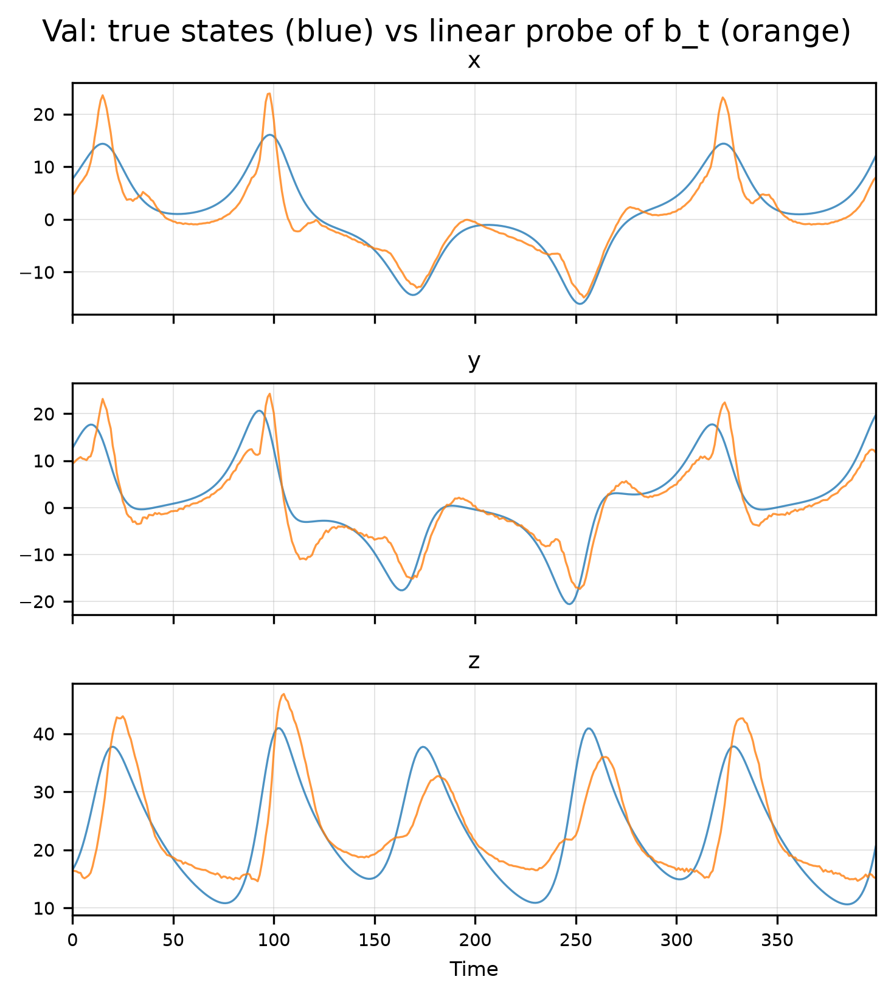

In [18]:
def FitProbe(B, S):
    """Least-squares affine map from latent b -> true state, fitted on train."""
    Design = np.concatenate([B, np.ones((len(B), 1))], axis=1)
    W, *_ = np.linalg.lstsq(Design, S, rcond=None)
    return W


def ApplyProbe(W, B):
    return np.concatenate([B, np.ones((len(B), 1))], axis=1) @ W


Probe = FitProbe(BTrain, StatesTrain)
StatesValHat = ApplyProbe(Probe, BVal)
StatesTestHat = ApplyProbe(Probe, BTest)

Pair = np.stack([StatesVal[Slice], StatesValHat[Slice]])
fig, axz = PlotNFeatSeries(Pair, Cols=1, Height=1.8, Titles=["x", "y", "z"])
fig.suptitle("Val: true states (blue) vs linear probe of b_t (orange)", y=1.005)
fig.show()

for i, Name in enumerate(["x", "y", "z"]):
    print(f"val  {Name}: R2 = {R2(StatesVal[:, i], StatesValHat[:, i]):.4f}")
for i, Name in enumerate(["x", "y", "z"]):
    print(f"test {Name}: R2 = {R2(StatesTest[:, i], StatesTestHat[:, i]):.4f}")

### Raw (unaligned) latent

C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\3085196959.py:3: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\3085196959.py:7: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


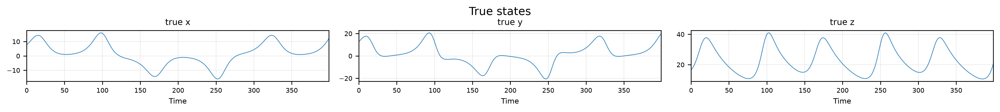

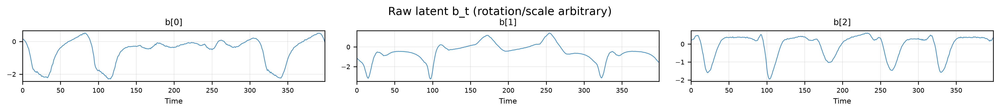

In [19]:
fig, axz = PlotNFeatSeries(StatesVal[Slice][None], Cols=3, Titles=["true x", "true y", "true z"])
fig.suptitle("True states", y=1.02)
fig.show()

fig, axz = PlotNFeatSeries(BVal[Slice][None], Cols=3, Titles=[f"b[{i}]" for i in range(K)])
fig.suptitle("Raw latent b_t (rotation/scale arbitrary)", y=1.02)
fig.show()

C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\1043623110.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


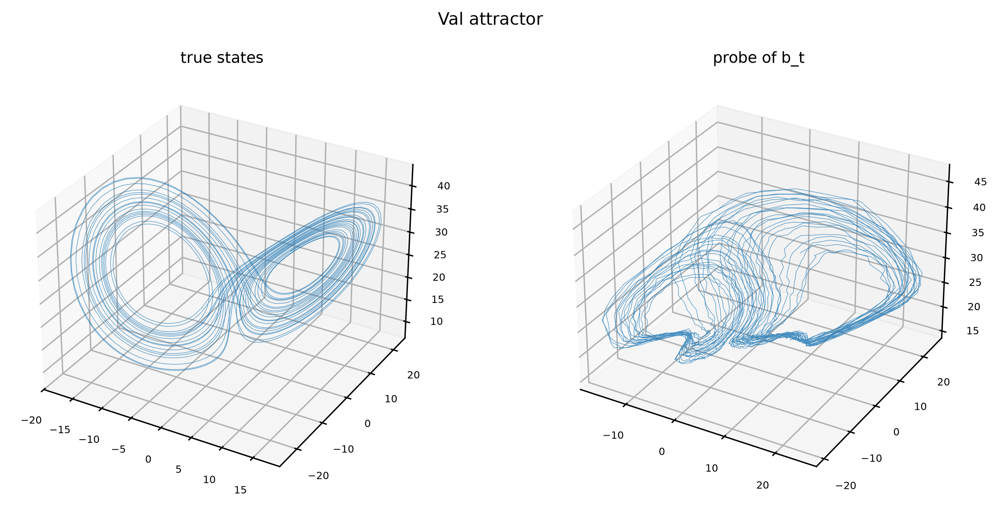

In [20]:
fig = plt.figure(figsize=(9, 4.2), dpi=300)
for i, (Data, Title) in enumerate([(StatesVal, "true states"), (StatesValHat, "probe of b_t")]):
    Ax = fig.add_subplot(1, 2, i + 1, projection="3d")
    Ax.plot(Data[:, 0], Data[:, 1], Data[:, 2], linewidth=0.3, alpha=0.8)
    Ax.set_title(Title, fontsize=9)
    Ax.tick_params(labelsize=6)
fig.suptitle("Val attractor", fontsize=10)
fig.tight_layout()
fig.show()

## Bounded latent sanity

Is `C_t` saturating at 0/1, or collapsing to a constant?

C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\1328895732.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
C:\Users\ArpitGoel\AppData\Local\Temp\ipykernel_24896\1328895732.py:17: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


per-cell std across val (mean): 0.2811579
fraction of entries outside [0.02, 0.98]: 0.224328125


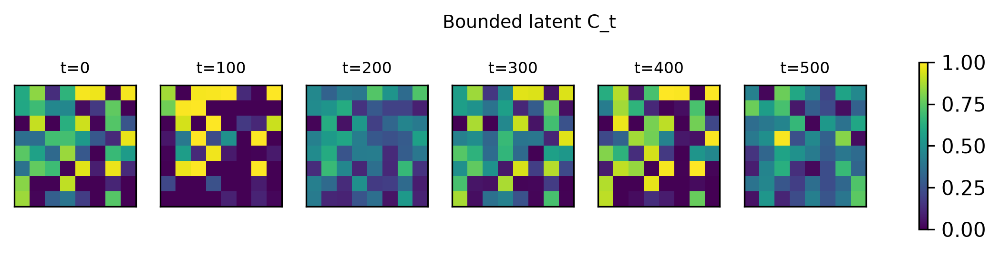

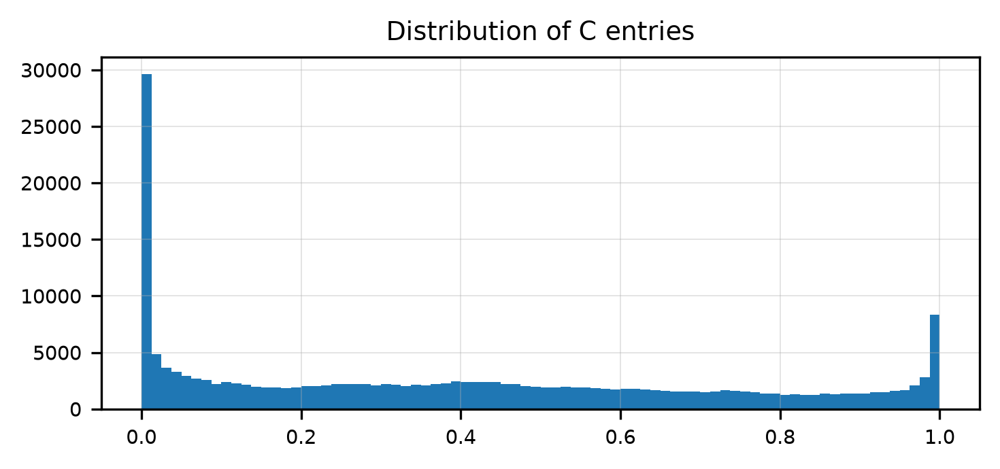

In [21]:
Show = [0, 100, 200, 300, 400, 500]
fig, axz = plt.subplots(1, len(Show), figsize=(1.6 * len(Show), 1.9), dpi=300)
for Ax, t in zip(axz, Show):
    Im = Ax.imshow(CVal[t], vmin=0, vmax=1, cmap="viridis")
    Ax.set_title(f"t={t}", fontsize=8)
    Ax.set_xticks([]); Ax.set_yticks([])
fig.colorbar(Im, ax=axz, shrink=0.8)
fig.suptitle("Bounded latent C_t", fontsize=9)
fig.show()

fig, Ax = plt.subplots(figsize=(5, 2.4), dpi=300)
Ax.hist(CVal.ravel(), bins=80, range=(0, 1))
Ax.set_title("Distribution of C entries", fontsize=9)
Ax.tick_params(labelsize=7)
Ax.grid(True, linewidth=0.4, alpha=0.4)
fig.tight_layout()
fig.show()

print("per-cell std across val (mean):", CVal.reshape(len(CVal), -1).std(0).mean())
print("fraction of entries outside [0.02, 0.98]:", ((CVal < 0.02) | (CVal > 0.98)).mean())